In [17]:
"""**Data Loading**"""



import os

os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import numpy as np

import cv2

import matplotlib.pyplot as plt





DATA_DIR = 'TrayDataset'

x_train_dir = os.path.join(DATA_DIR, 'XTrain')

y_train_dir = os.path.join(DATA_DIR, 'yTrain')


x_valid_dir = os.path.join(DATA_DIR, 'XVal')

y_valid_dir = os.path.join(DATA_DIR, 'yVal')



x_test_dir = os.path.join(DATA_DIR, 'XTest')

y_test_dir = os.path.join(DATA_DIR, 'yTest')



path, dirs, files = next(os.walk(x_train_dir))

file_count = len(files)

print(file_count)



1217


In [18]:
CLASSES = ['background','tray','cutlery','form','straw','meatball',

               'beef','roastlamb','beeftomatocasserole','ham','bean','cucumber',

               'leaf','tomato','boiledrice','beefmexicanmeatballs',

               'spinachandpumpkinrisotto','bakedfish','gravy','zucchini','carrot',

               'broccoli','pumpkin','celery','sandwich','sidesalad','tartaresauce',

               'jacketpotato','creamedpotato','bread','margarine',

               'soup','apple','cannedfruit','milk','vanillayogurt',

               'jelly','custard','lemonsponge','juice','applejuice','orangejuice','water']


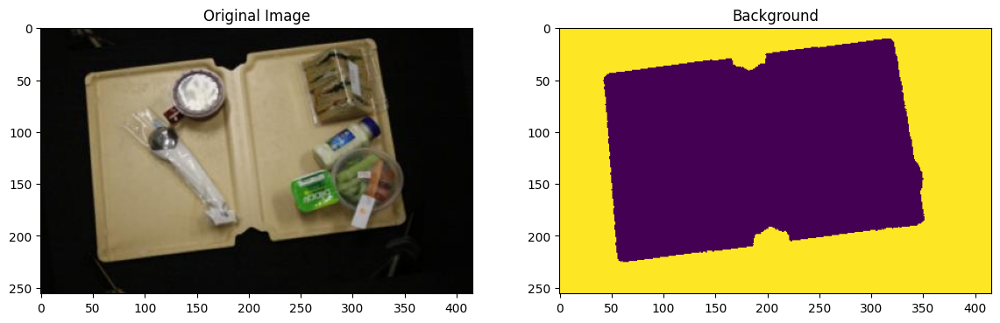

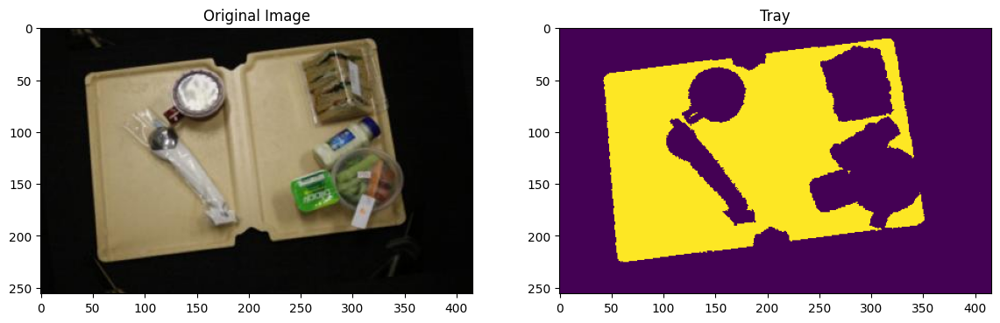

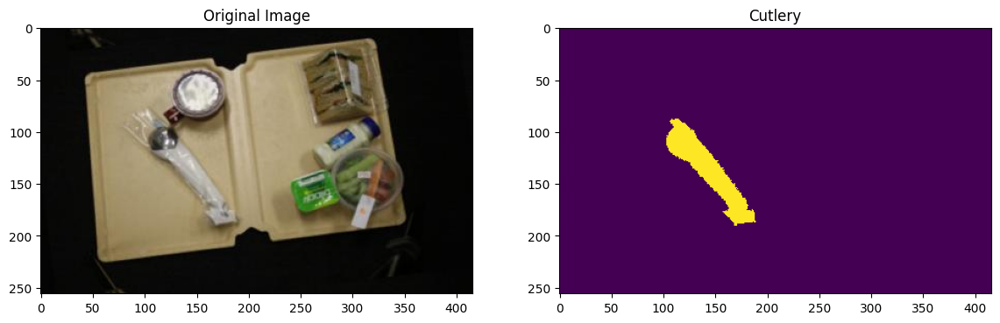

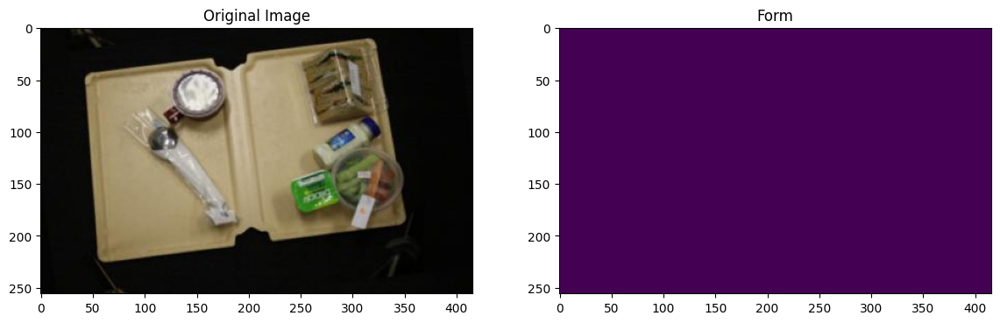

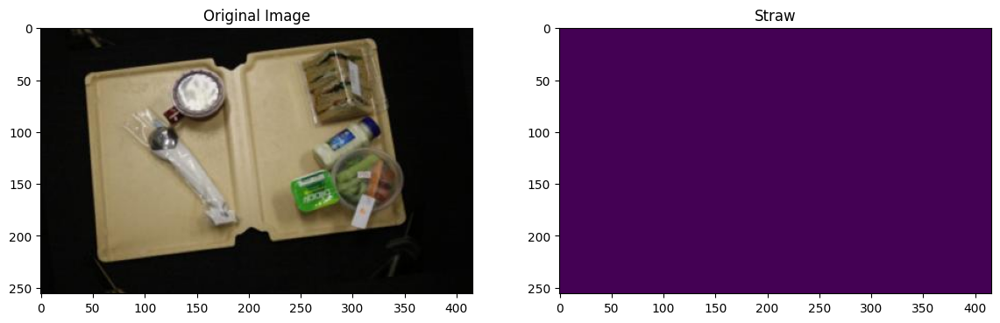

...

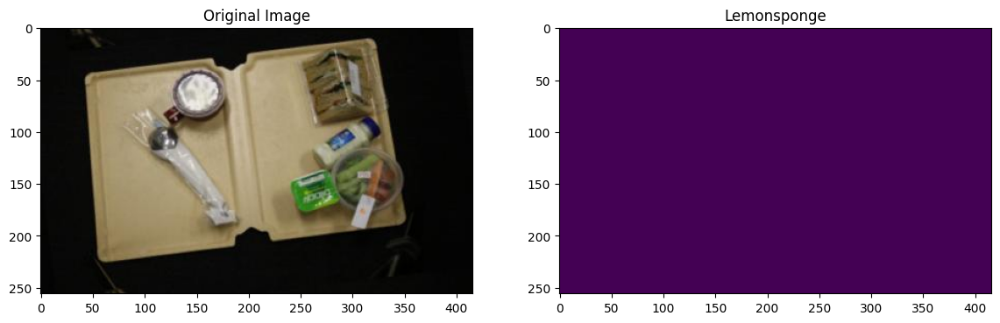

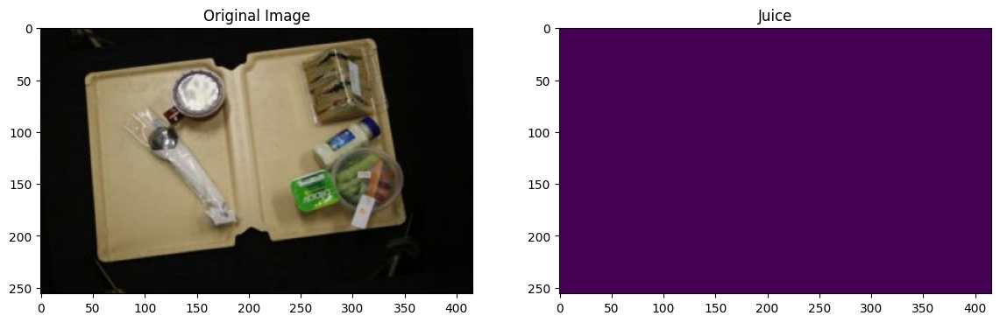

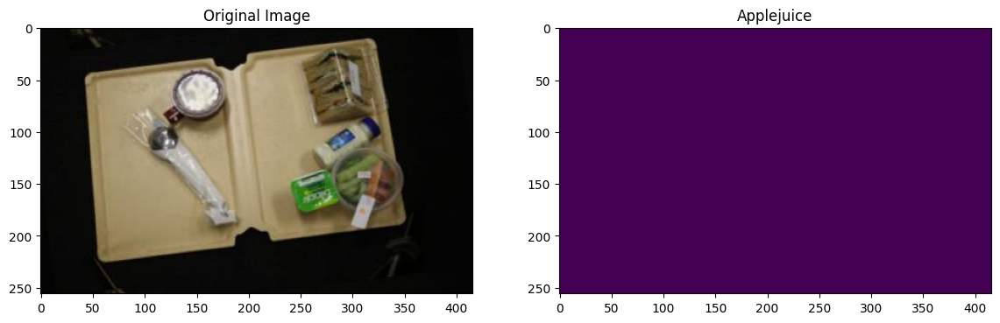

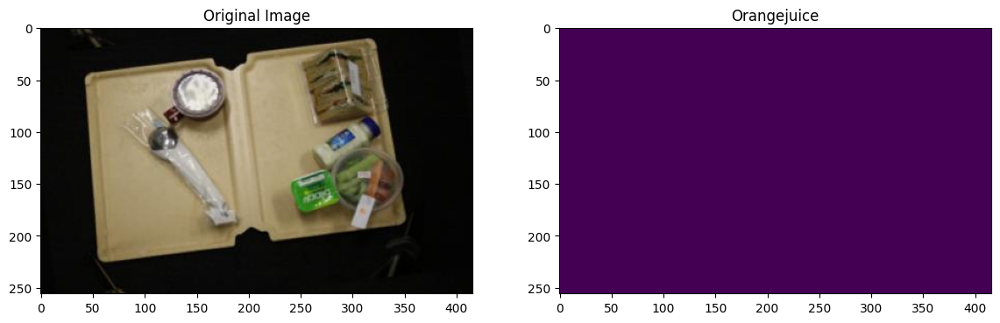

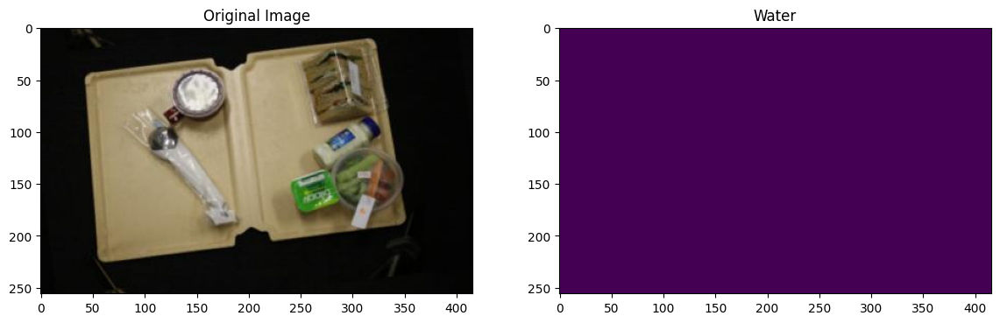

In [19]:
from torch.utils.data import Dataset as BaseDataset





class Dataset(BaseDataset):

    """TrayDataset. Read images, apply augmentation and preprocessing transformations.

   

    Args:

        images_dir (str): path to images folder

        masks_dir (str): path to segmentation masks folder

        class_values (list): values of classes to extract from segmentation mask

        augmentation (albumentations.Compose): data transfromation pipeline

            (e.g. flip, scale, etc.)

        preprocessing (albumentations.Compose): data preprocessing

            (e.g. noralization, shape manipulation, etc.)

   

    """

   

    def __init__(

            self,

            images_dir,

            masks_dir,

            classes=None,

            augmentation=None,

            preprocessing=None,

    ):

        #get images(x) and masks(y) ids

        self.ids_x = sorted(os.listdir(images_dir))

        #['1001a01.jpg', '1005a.jpg', '1006a72.jpg', '2001a72.jpg', '2002a.jpg'] etc.

        self.ids_y = sorted(os.listdir(masks_dir))

       

        #get images(x) and masks(y) full paths (fps)

        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids_x]

        #'/content/drive/My Drive/Colab Notebooks/TrayDataset/XTest/1001a01.jpg'

        self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.ids_y]

       

        # convert str names to class values on masks

        self.class_values = [CLASSES.index(cls.lower()) for cls in classes]

        self.augmentation = augmentation

        self.preprocessing = preprocessing

   

    def __getitem__(self, i):

       

        # read data

        image = cv2.imread(self.images_fps[i])

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(self.masks_fps[i], 0)

       

        # extract certain classes from mask (e.g. cars)

        masks = [(mask == v) for v in self.class_values]

        mask = np.stack(masks, axis=-1).astype('float')

       

        # apply augmentations

        if self.augmentation:

            sample = self.augmentation(image=image, mask=mask)

            image, mask = sample['image'], sample['mask']

       

        # apply preprocessing

        if self.preprocessing:

            sample = self.preprocessing(image=image, mask=mask)

            image, mask = sample['image'], sample['mask']


        return image, mask

       

    def __len__(self):

        return len(self.ids_x)

def visualize(image, mask, label=None, truth=None,  augment=False):

    if truth is None:

        plt.figure(figsize=(14, 20))

        plt.subplot(1, 2, 1)

        plt.imshow(image)

        if augment == False:

            plt.title(f"{'Original Image'}")

        else:

            plt.title(f"{'Mask'}")





        plt.subplot(1, 2, 2)

        plt.imshow(mask)

        if label is not None:

            plt.title(f"{label.capitalize()}")



        plt.show()
        plt.close()


for label  in CLASSES:

    dataset = Dataset(x_test_dir, y_test_dir, classes=[label])

    image, mask = dataset[11]

    visualize(

        image=image, mask=mask.squeeze(),

        label  = label )

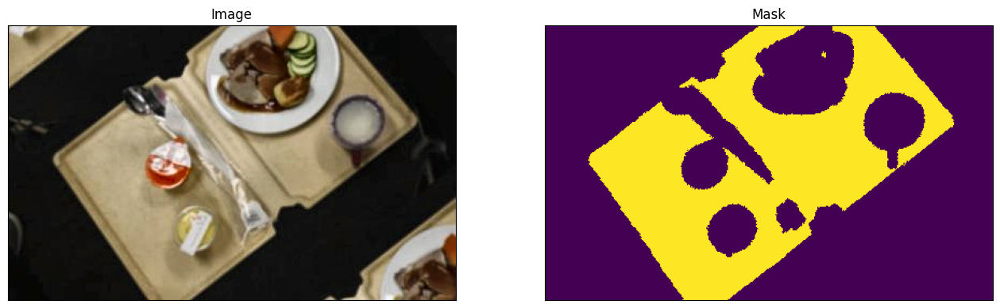

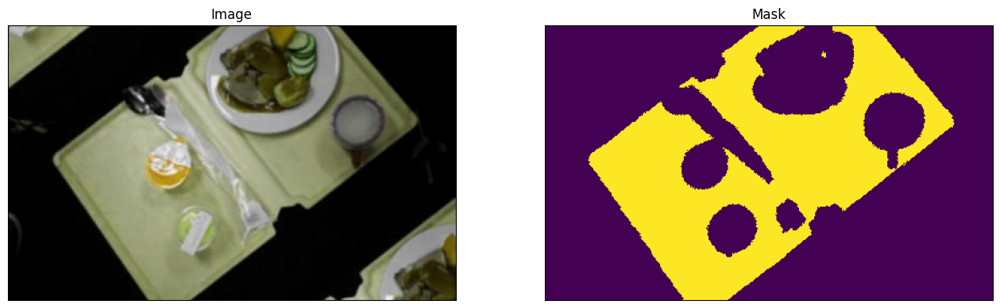

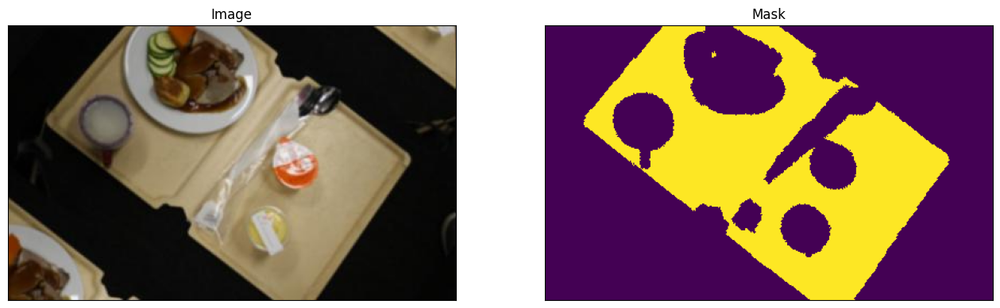

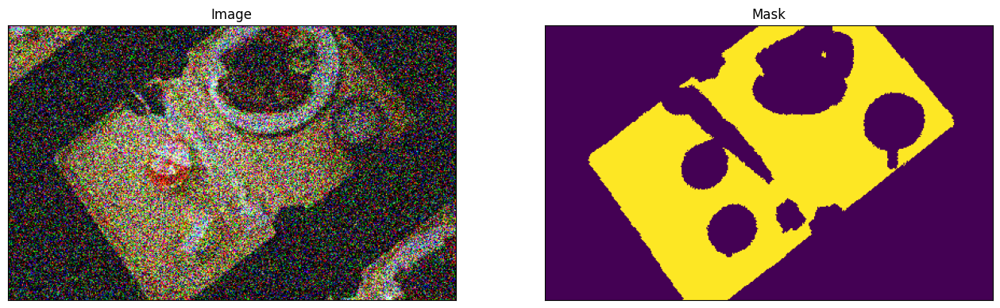

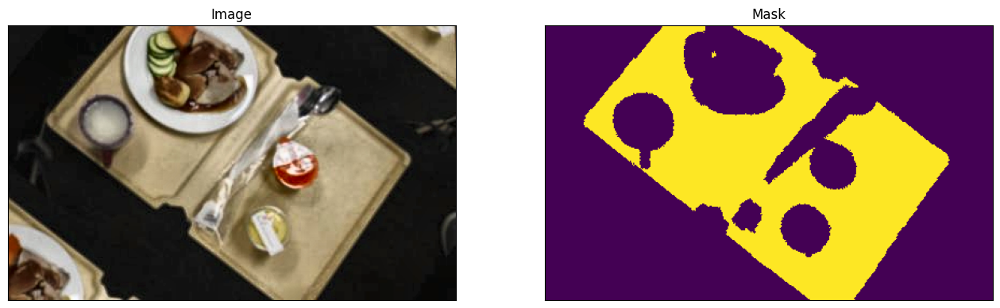

In [22]:
import albumentations as albu



def get_training_augmentation():

    train_transform = [



        albu.Resize(256, 416, p=1),

        albu.HorizontalFlip(p=0.5),



        albu.OneOf([

            albu.RandomBrightnessContrast(

                  brightness_limit=0.4, contrast_limit=0.4, p=1),

            albu.CLAHE(p=1),

            albu.HueSaturationValue(p=1)

            ],

            p=0.9,

        ),



        albu.GaussNoise(p=0.2)

    ]

    return albu.Compose(train_transform)



def get_validation_augmentation():

    """Add paddings to make image shape divisible by 32"""

    test_transform = [

        albu.PadIfNeeded(256, 416)

    ]

    return albu.Compose(test_transform)





def to_tensor(x, **kwargs):

    return x.transpose(2, 0, 1).astype('float32')





def get_preprocessing(preprocessing_fn):

    _transform = [

        albu.Lambda(image=preprocessing_fn),

        albu.Lambda(image=to_tensor, mask=to_tensor),

    ]

    return albu.Compose(_transform)



# helper function for data visualization

def visualizeData(**images):

    """PLot images in one row."""

    n = len(images)

    plt.figure(figsize=(16, 5))

    for i, (name, image) in enumerate(images.items()):

        plt.subplot(1, n, i + 1)

        plt.xticks([])

        plt.yticks([])

        plt.title(' '.join(name.split('_')).title())

        plt.imshow(image)

    plt.show()



augmented_dataset = Dataset(

    x_train_dir,

    y_train_dir,

    augmentation=get_training_augmentation(),

    classes=['tray'],

)



# same image with different  transforms

for i in range(5):

    image, mask = augmented_dataset[8]

    visualizeData(image=image, mask=mask.squeeze(-1))